In [283]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import random

DATA_FILE_PATH = 'datasets/Cardio_Train.csv'

data_raw = pd.read_csv(filepath_or_buffer=DATA_FILE_PATH)
data_raw = data_raw.drop_duplicates(keep='first')
data_raw = data_raw.dropna()
data_raw.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [337]:
def remove_outliers(df, columns):
    for column in columns:
        q_low = df[column].quantile(0.01)
        q_hi  = df[column].quantile(0.99)
        df = df[(df[column] < q_hi) & (df[column] > q_low)]
    return df

data = remove_outliers(data_raw, ['age','ap_hi','weight','height'])

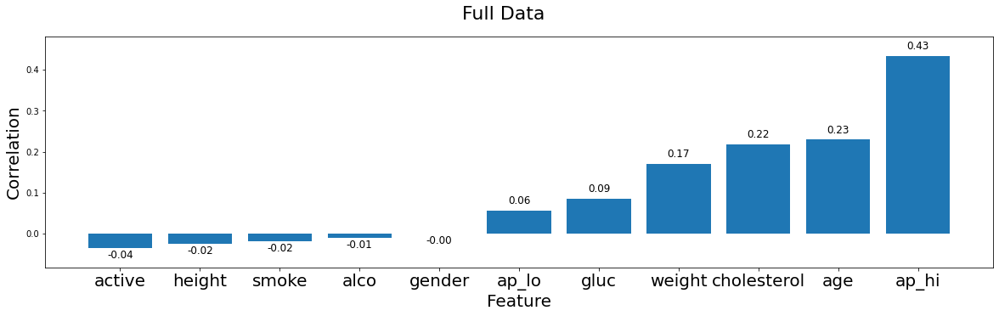

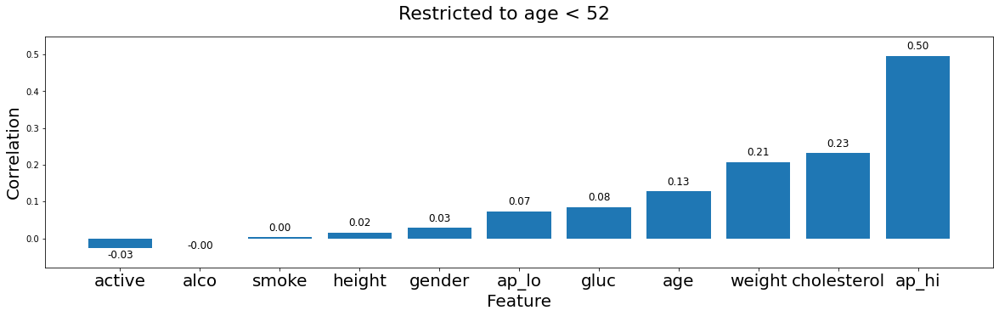

In [341]:
def show_correlations(df, title):
    corr = df.corr().drop('id')
    cardio_corr = corr['cardio'].sort_values()[:-1]
    f, ax = plt.subplots(figsize = (20,5))
    f.suptitle(title, fontsize=22)
    ax.set_ylabel('Correlation',fontsize=20)
    ax.set_xlabel('Feature',fontsize=20)
    ax.tick_params(axis='x', labelsize=20)
    ax.margins(y=0.1)
    rects = plt.bar(cardio_corr.index, cardio_corr)
    autolabel(ax,rects)

def autolabel(ax,rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        
        ax.annotate(f'{height:0.2F}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 10 * abs(height)/height -5 ),  # 3 points vertical offset
                    textcoords="offset points",
                    fontsize = 12,
                    ha='center', va='bottom')

data_age_restricted = data[data['age']/365<52]

show_correlations(data, title='Full Data')
show_correlations(data_age_restricted, title='Restricted to age < 52')


In [343]:
def standarized(x, columns):
    """Standarize column values"""
    x_std = x.copy(deep=True)
    for column in columns:
        x_std[column] = (x_std[column]-x_std[column].mean())/x_std[column].std()
    return x_std 

to_standarize = ['ap_hi', 'cholesterol']
data_std = standarized(data, to_standarize)
data_std_age_restricted = standarized(data_age_restricted, to_standarize)
data_std.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,-1.127343,80,-0.535737,1,0,0,1,0
1,1,20228,1,156,85.0,0.896734,90,2.407132,1,0,0,1,1
2,2,18857,1,165,64.0,0.222042,70,2.407132,1,0,0,0,1
3,3,17623,2,169,82.0,1.571427,100,-0.535737,1,0,0,1,1
4,4,17474,1,156,56.0,-1.802036,60,-0.535737,1,0,0,0,0


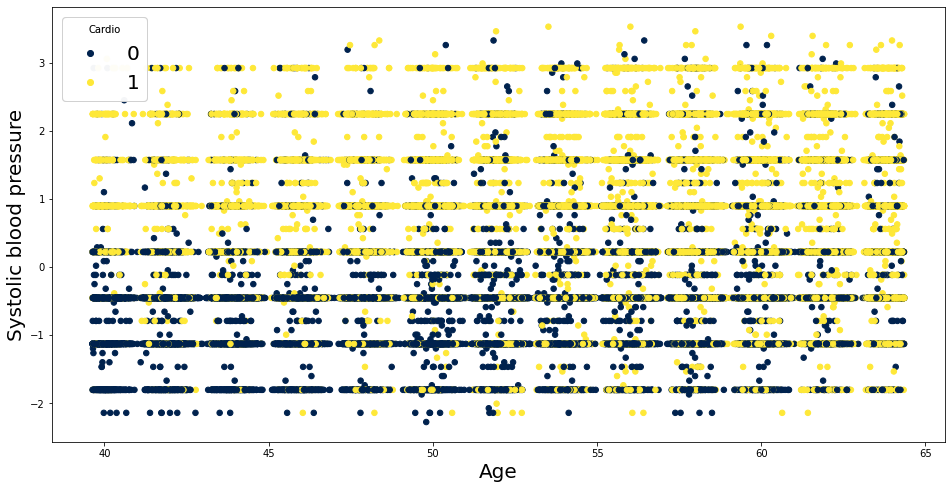

In [287]:
fig,ax = plt.subplots(figsize=(16,8))
scatter_data = data_std
x = scatter_data['age']/365
y = scatter_data['ap_hi']
c = scatter_data['cholesterol']
c = scatter_data['cardio']

scatter =ax.scatter(x=x, y=y, c=c, s=30, cmap='cividis')
ax.set_ylabel('Systolic blood pressure', fontsize=20)
ax.set_xlabel('Age', fontsize=20)
legend1 = ax.legend(*scatter.legend_elements(), loc="upper left", title="Cardio",fontsize=20)
ax.add_artist(legend1)


In [289]:
def iterate(*arrays, size=1):
    for i in range(math.ceil(len(arrays[0][0])/size)):
        yield map(lambda arr: np.array([a[i * size:(i + 1) * size] for a in arr]), arrays)

def sigmoid_activation(arr):
    return np.vectorize(lambda e: 1 / (1 + np.exp(-e)))(arr)

def predict(theta, X):
    return sigmoid_activation(theta.T.dot(X))

def classify(Y_pred):
    return np.vectorize(lambda y: int(y > 0.5))(Y_pred)

def cost(Y_pred, Y):
    return (Y * np.log(Y_pred) - (1 - Y) * np.log(1 - Y_pred)).sum()

def accuracy(a, b):
    return np.mean(a == b) * 100

def logistic_regression_mini_batch(X, Y, epochs, batch_size, learning_rate):
    n_features = X.shape[0]
    n_data = X.shape[1]

    theta = np.ones([n_features, 1])
    costs = []
    accuracies = []

    for _ in range(epochs):
        for sX, sY in iterate(X, Y, size=batch_size):
            sY_pred = predict(theta, sX)
            grad = 1 / batch_size * sX.dot((sY_pred - sY).T)
            theta -= learning_rate * grad

            _cost = cost(sY_pred, sY)
            costs.append(_cost)

            _accuracy = accuracy(classify(sY_pred), sY)
            accuracies.append(_accuracy)

    Y_pred = predict(theta,X)
    result = classify(Y_pred)
    _accuracy = accuracy(result,Y)
    return {'theta':theta, 'result':result, 'costs':costs, 'accuracy':_accuracy}

In [371]:
def to_x_data(df, *columns):
    n = len(df)
    x0 = np.ones([1, n])
    xn = np.array([df[column] for column in columns])
    return np.concatenate((x0, xn), axis = 0)

def get_model_data(df, X_features, Y_feature):
    X = to_x_data(df, *X_features)
    Y = np.array([df[Y_feature]])
    return X, Y

def get_input_data(df, X_features, Y_feature, test_ratio = 0.3):
    test_df_size = round(len(df) * test_ratio)
    test_df = df.sample(test_df_size)

    training_df = df.drop(test_df.index)
    training_df_size = len(training_df)

    training_data = get_model_data(training_df, X_features, Y_feature)
    test_data = get_model_data(test_df, X_features, Y_feature)

    print(f'X features: {X_features}\n'
      f'Y feature: {Y_feature}\n'
      f'Training data size: {training_data_size} - {(1-test_data_ratio)*100}%\n'
      f'Test data size: {test_data_size} - {test_data_ratio*100}%\n')
    return training_data, test_data

In [407]:
X_features = ['ap_hi' ,'cholesterol']
Y_feature = 'cardio'
training_data, test_data = get_input_data(data_std_age_restricted, X_features, Y_feature)

X features: ['ap_hi', 'cholesterol']
Y feature: cardio
Training data size: 17614 - 70.0%
Test data size: 7549 - 30.0%



Execution time 2.40
Model parameters:
	Epochs: 40
	Batch size: 256
	Learning rate: 3.70E-02

Model output:
	Equation: y = -0.51 + 1.26*ap_hi + 0.34*cholesterol
	Training accuracy: 77.04%
	Test accuracy: 78.28%



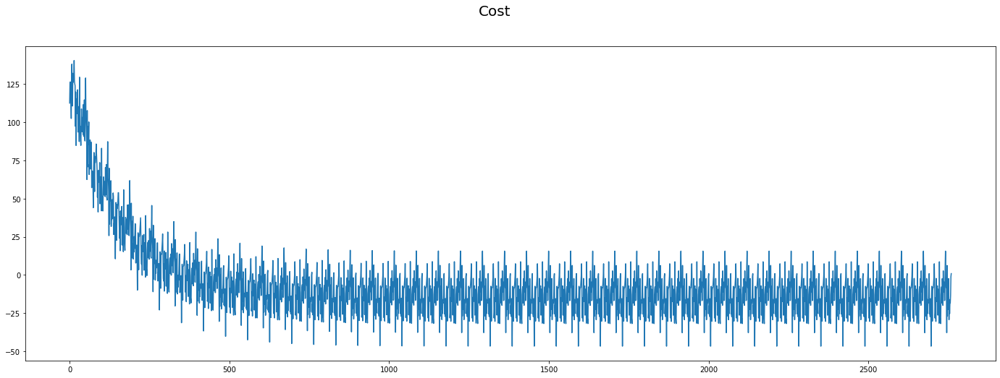

In [409]:
# 79.11 [ap_hi]                      epochs=40, learning_rate=10**-2, batch_size=256
# 79.35 [ap_hi, cholesterol]         epochs=40, learning_rate=5**-2, batch_size=256
# 79.35 [ap_hi, cholesterol]         epochs=30, learning_rate=3**-2, batch_size=256
# 79.44 [ap_hi, cholesterol, weight] epochs=80, learning_rate=4.9**-3, batch_size=256
import time
def to_equation(theta, features):
    vals = list(map(lambda v: str(round(v,2)), theta))
    return f"y = {vals[0]} + {' + '.join([f'{t}*{f}' for t, f in zip(vals[1:],features)])}"



X_training, Y_training = training_data
params = {'epochs':40, 'learning_rate':3**-3, 'batch_size':256}

start = time.time()
model = logistic_regression_mini_batch(X_training, Y_training, **params)
execution_time = time.time()-start

X_test, Y_test = test_data 
Y_test_pred = predict(model['theta'], X_test)
test_result = classify(Y_test_pred)
test_accuracy = accuracy(test_result, Y_test)

print(f'Execution time {(execution_time):0.2F}')
print(f'Model parameters:\n'
      f"\tEpochs: {params['epochs']}\n"
      f"\tBatch size: {params['batch_size']}\n"
      f"\tLearning rate: {params['learning_rate']:0.2E}\n"
      )
print(f"Model output:\n"
      f"\tEquation: {to_equation(model['theta'].flatten(), X_features)}\n"
      f"\tTraining accuracy: {model['accuracy']:0.2F}%\n"
      f"\tTest accuracy: {test_accuracy:0.2F}%\n"
    )

fig = plt.figure(figsize=(24,8))
fig.suptitle('Cost', fontsize=20)
p=plt.plot(model['costs'])